Learning To Simulate

last update: 12/14/2025

The updated and compatible fixed versions of the relevant packages are installed in the following three blocks.
Be sure to restart the session after running the three blocks and run the second block again after reloading.

In [ ]:
!pip install torch==2.2.0+cu121 torchvision==0.17.0+cu121 torchaudio==2.2.0 --extra-index-url https://download.pytorch.org/whl/cu121
!pip install "numpy<2"
!pip install torch-geometric

In [1]:
import os
import torch
print(f"PyTorch has version {torch.__version__} with cuda {torch.version.cuda}")

PyTorch has version 2.2.0+cu121 with cuda 12.1


In [ ]:
torch_version = torch.__version__.split('+')[0]
cuda_version = torch.version.cuda

if cuda_version:
    cuda_suffix = f"cu{cuda_version.replace('.', '')}"
else:
    cuda_suffix = "cpu"

print(f"Detected PyTorch: {torch_version}, CUDA: {cuda_suffix}")

install_cmd = (
    f"pip install torch-scatter torch-sparse torch-cluster torch-spline-conv "
    f"-f https://data.pyg.org/whl/torch-{torch_version}+{cuda_suffix}.html"
)

os.system(install_cmd)

The lower block is for downloading the relevant datasets from the main project repository in .tfrecord format. The lower block is also code for converting the old TensorFlow arrays to a more compatible version of the dataset with all libraries (in this case PyTorch).

In [2]:
DATASET_NAME = "WaterDrop"
OUTPUT_DIR = os.path.join("temp", "datasets", DATASET_NAME)

BASE_URL = f"https://storage.googleapis.com/learning-to-simulate-complex-physics/Datasets/{DATASET_NAME}"

!mkdir -p "$OUTPUT_DIR"

META_DATA_PATH = f"{OUTPUT_DIR}/metadata.json"
CLOUD_PATH = f"{BASE_URL}/metadata.json"
!wget -O "$META_DATA_PATH" "$CLOUD_PATH"

for split in ["test", "train", "valid"]:
  DATA_PATH = f"{OUTPUT_DIR}/{split}.tfrecord"
  CLOUD_PATH = f"{BASE_URL}/{split}.tfrecord"
  !wget -O "$DATA_PATH" "$CLOUD_PATH"

--2025-12-13 21:48:43--  https://storage.googleapis.com/learning-to-simulate-complex-physics/Datasets/WaterDrop/metadata.json
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.207, 142.251.2.207, 74.125.137.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 361 [application/octet-stream]
Saving to: ‘temp/datasets/WaterDrop/metadata.json’

temp/datasets/Water 100%[===================>]     361  --.-KB/s    in 0s      

2025-12-13 21:48:43 (201 MB/s) - ‘temp/datasets/WaterDrop/metadata.json’ saved [361/361]

--2025-12-13 21:48:43--  https://storage.googleapis.com/learning-to-simulate-complex-physics/Datasets/WaterDrop/test.tfrecord
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.101.207, 142.251.2.207, 74.125.137.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.101.207|:443... connected.
HTTP request sent, 

In [3]:
import json
import numpy as np
import tensorflow as tf
import os
from tqdm import tqdm

def parse_proto(example_proto):
    context_features = {
        'particle_type': tf.io.FixedLenFeature([], tf.string),
        'key': tf.io.FixedLenFeature([], tf.int64),
    }
    sequence_features = {
        'position': tf.io.FixedLenSequenceFeature([], tf.string, allow_missing=True)
    }

    context, sequence = tf.io.parse_single_sequence_example(
        example_proto,
        context_features=context_features,
        sequence_features=sequence_features
    )

    particle_type = tf.io.decode_raw(context['particle_type'], tf.int64)

    position_flat = tf.map_fn(
        lambda x: tf.io.decode_raw(x, tf.float32),
        sequence['position'],
        dtype=tf.float32
    )

    num_particles = tf.shape(particle_type)[0]
    position = tf.reshape(position_flat, [-1, num_particles, 2])

    return position, particle_type


def update_stats(prev_mean, prev_m2, prev_count, new_data):
    new_data = new_data.reshape(-1, new_data.shape[-1])
    n = new_data.shape[0]

    if n == 0:
        return prev_mean, prev_m2, prev_count

    new_count = prev_count + n
    delta = new_data - prev_mean
    new_mean = prev_mean + np.sum(delta, axis=0) / new_count
    delta2 = new_data - new_mean
    new_m2 = prev_m2 + np.sum(delta * delta2, axis=0)

    return new_mean, new_m2, new_count


def estimate_total_records(filepath):
    file_size = os.path.getsize(filepath)

    for record in tf.data.TFRecordDataset(filepath).take(1):
        record_size = len(record.numpy()) + 16
        break
    else:
        return None

    if record_size == 0:
        return None

    return int(file_size / record_size)


def convert_split(split_name, input_path, output_dir, existing_metadata_path):
    print(f"Converting split: {split_name}")

    pos_file = os.path.join(output_dir, f"{split_name}_position.dat")
    type_file = os.path.join(output_dir, f"{split_name}_particle_type.dat")
    offset_file = os.path.join(output_dir, f"{split_name}_offset.json")

    offsets = {}
    global_pos_index = 0
    global_type_index = 0
    traj_idx = 0

    vel_mean, vel_m2, vel_count = np.zeros(2), np.zeros(2), 0
    acc_mean, acc_m2, acc_count = np.zeros(2), np.zeros(2), 0

    total_est = estimate_total_records(input_path)

    with open(pos_file, "wb") as f_pos, open(type_file, "wb") as f_type:
        dataset = tf.data.TFRecordDataset(input_path)

        for raw_record in tqdm(dataset, unit="traj", total=total_est, desc=f"{split_name}"):
            positions, particle_types = parse_proto(raw_record)

            positions = positions.numpy().astype(np.float32)
            particle_types = particle_types.numpy().astype(np.int64)

            f_pos.write(positions.tobytes())
            f_type.write(particle_types.tobytes())

            offsets[traj_idx] = {
                "particle_type": {
                    "offset": global_type_index,
                    "length": len(particle_types)
                },
                "position": {
                    "offset": global_pos_index,
                    "shape": positions.shape
                }
            }

            global_pos_index += positions.size
            global_type_index += particle_types.size
            traj_idx += 1

            vel = positions[1:] - positions[:-1]
            vel_mean, vel_m2, vel_count = update_stats(vel_mean, vel_m2, vel_count, vel)

            acc = vel[1:] - vel[:-1]
            acc_mean, acc_m2, acc_count = update_stats(acc_mean, acc_m2, acc_count, acc)

    with open(offset_file, "w") as f:
        json.dump(offsets, f)

    vel_std = np.sqrt(vel_m2 / vel_count)
    acc_std = np.sqrt(acc_m2 / acc_count)

    print(f"Finished split {split_name}: {traj_idx} trajectories")

    return vel_mean, vel_std, acc_mean, acc_std


DATASET_DIR = "temp/datasets/WaterDrop"
METADATA_PATH = os.path.join(DATASET_DIR, "metadata.json")

splits = {
    "train": os.path.join(DATASET_DIR, "train.tfrecord"),
    "test": os.path.join(DATASET_DIR, "test.tfrecord"),
    "valid": os.path.join(DATASET_DIR, "valid.tfrecord"),
}

final_stats = {}

for split, path in splits.items():
    stats = convert_split(split, path, DATASET_DIR, METADATA_PATH)
    final_stats[split] = {
        "vel_mean": stats[0].tolist(),
        "vel_std": stats[1].tolist(),
        "acc_mean": stats[2].tolist(),
        "acc_std": stats[3].tolist()
    }


if os.path.exists(METADATA_PATH):
    with open(METADATA_PATH, "r") as f:
        meta = json.load(f)
else:
    meta = {}

meta["vel_mean"] = final_stats["train"]["vel_mean"]
meta["vel_std"] = final_stats["train"]["vel_std"]
meta["acc_mean"] = final_stats["train"]["acc_mean"]
meta["acc_std"] = final_stats["train"]["acc_std"]

if "default_connectivity_radius" not in meta:
    meta["default_connectivity_radius"] = 0.015

with open(METADATA_PATH, "w") as f:
    json.dump(meta, f, indent=4)

print("All splits processed and metadata updated.")


Converting split: train


train: 1000traj [24:03,  1.44s/traj]


Finished split train: 1000 trajectories
Converting split: test


test:  53%|█████▎    | 30/57 [00:42<00:38,  1.42s/traj]


Finished split test: 30 trajectories
Converting split: valid


valid:  86%|████████▌ | 30/35 [00:43<00:07,  1.45s/traj]

Finished split valid: 30 trajectories
All splits processed and metadata updated.


The next blocks are functions to define the graph and the training process.

In [4]:
import json
import numpy as np
import torch_geometric as pyg

def generate_noise(position_seq, noise_std):
    velocity_seq = position_seq[:, 1:] - position_seq[:, :-1]
    time_steps = velocity_seq.size(1)
    velocity_noise = torch.randn_like(velocity_seq) * (noise_std / time_steps ** 0.5)
    velocity_noise = velocity_noise.cumsum(dim=1)
    position_noise = velocity_noise.cumsum(dim=1)
    position_noise = torch.cat((torch.zeros_like(position_noise)[:, 0:1], position_noise), dim=1)
    return position_noise


def preprocess(particle_type, position_seq, target_position, metadata, noise_std):
    position_noise = generate_noise(position_seq, noise_std)
    position_seq = position_seq + position_noise

    recent_position = position_seq[:, -1]
    velocity_seq = position_seq[:, 1:] - position_seq[:, :-1]

    n_particle = recent_position.size(0)
    edge_index = pyg.nn.radius_graph(recent_position, metadata["default_connectivity_radius"], loop=True, max_num_neighbors=n_particle)

    normal_velocity_seq = (velocity_seq - torch.tensor(metadata["vel_mean"])) / torch.sqrt(torch.tensor(metadata["vel_std"]) ** 2 + noise_std ** 2)
    boundary = torch.tensor(metadata["bounds"])
    distance_to_lower_boundary = recent_position - boundary[:, 0]
    distance_to_upper_boundary = boundary[:, 1] - recent_position
    distance_to_boundary = torch.cat((distance_to_lower_boundary, distance_to_upper_boundary), dim=-1)
    distance_to_boundary = torch.clip(distance_to_boundary / metadata["default_connectivity_radius"], -1.0, 1.0)

    dim = recent_position.size(-1)
    edge_displacement = (torch.gather(recent_position, dim=0, index=edge_index[0].unsqueeze(-1).expand(-1, dim)) -
                   torch.gather(recent_position, dim=0, index=edge_index[1].unsqueeze(-1).expand(-1, dim)))
    edge_displacement /= metadata["default_connectivity_radius"]
    edge_distance = torch.norm(edge_displacement, dim=-1, keepdim=True)

    if target_position is not None:
        last_velocity = velocity_seq[:, -1]
        next_velocity = target_position + position_noise[:, -1] - recent_position
        acceleration = next_velocity - last_velocity
        acceleration = (acceleration - torch.tensor(metadata["acc_mean"])) / torch.sqrt(torch.tensor(metadata["acc_std"]) ** 2 + noise_std ** 2)
    else:
        acceleration = None

    graph = pyg.data.Data(
        x=particle_type,
        edge_index=edge_index,
        edge_attr=torch.cat((edge_displacement, edge_distance), dim=-1),
        y=acceleration,
        pos=torch.cat((velocity_seq.reshape(velocity_seq.size(0), -1), distance_to_boundary), dim=-1)
    )
    return graph

In [5]:
class OneStepDataset(pyg.data.Dataset):
    def __init__(self, data_path, split, window_length=7, noise_std=0.0, return_pos=False):
        super().__init__()

        with open(os.path.join(data_path, "metadata.json")) as f:
            self.metadata = json.load(f)
        with open(os.path.join(data_path, f"{split}_offset.json")) as f:
            self.offset = json.load(f)
        self.offset = {int(k): v for k, v in self.offset.items()}
        self.window_length = window_length
        self.noise_std = noise_std
        self.return_pos = return_pos

        self.particle_type = np.memmap(os.path.join(data_path, f"{split}_particle_type.dat"), dtype=np.int64, mode="r")
        self.position = np.memmap(os.path.join(data_path, f"{split}_position.dat"), dtype=np.float32, mode="r")

        for traj in self.offset.values():
            self.dim = traj["position"]["shape"][2]
            break

        self.windows = []
        for traj in self.offset.values():
            size = traj["position"]["shape"][1]
            length = traj["position"]["shape"][0] - window_length + 1
            for i in range(length):
                desc = {
                    "size": size,
                    "type": traj["particle_type"]["offset"],
                    "pos": traj["position"]["offset"] + i * size * self.dim,
                }
                self.windows.append(desc)

    def len(self):
        return len(self.windows)

    def get(self, idx):
        window = self.windows[idx]
        size = window["size"]
        particle_type = self.particle_type[window["type"]: window["type"] + size].copy()
        particle_type = torch.from_numpy(particle_type)
        position_seq = self.position[window["pos"]: window["pos"] + self.window_length * size * self.dim].copy()
        position_seq.resize(self.window_length, size, self.dim)
        position_seq = position_seq.transpose(1, 0, 2)
        target_position = position_seq[:, -1]
        position_seq = position_seq[:, :-1]
        target_position = torch.from_numpy(target_position)
        position_seq = torch.from_numpy(position_seq)

        with torch.no_grad():
            graph = preprocess(particle_type, position_seq, target_position, self.metadata, self.noise_std)
        if self.return_pos:
          return graph, position_seq[:, -1]
        return graph

In [6]:
class RolloutDataset(pyg.data.Dataset):
    def __init__(self, data_path, split, window_length=7):
        super().__init__()

        with open(os.path.join(data_path, "metadata.json")) as f:
            self.metadata = json.load(f)
        with open(os.path.join(data_path, f"{split}_offset.json")) as f:
            self.offset = json.load(f)
        self.offset = {int(k): v for k, v in self.offset.items()}
        self.window_length = window_length

        self.particle_type = np.memmap(os.path.join(data_path, f"{split}_particle_type.dat"), dtype=np.int64, mode="r")
        self.position = np.memmap(os.path.join(data_path, f"{split}_position.dat"), dtype=np.float32, mode="r")

        for traj in self.offset.values():
            self.dim = traj["position"]["shape"][2]
            break

    def len(self):
        return len(self.offset)

    def get(self, idx):
        traj = self.offset[idx]
        size = traj["position"]["shape"][1]
        time_step = traj["position"]["shape"][0]
        particle_type = self.particle_type[traj["particle_type"]["offset"]: traj["particle_type"]["offset"] + size].copy()
        particle_type = torch.from_numpy(particle_type)
        position = self.position[traj["position"]["offset"]: traj["position"]["offset"] + time_step * size * self.dim].copy()
        position.resize(traj["position"]["shape"])
        position = torch.from_numpy(position)
        data = {"particle_type": particle_type, "position": position}
        return data

The first item in the valid set is a graph: Data(x=[482], edge_index=[2, 3070], edge_attr=[3070, 3], y=[482, 2], pos=[482, 14])
This graph has 482 nodes and 3070 edges.
Each node is a particle and each edge is the interaction between two particles.
Each node has 1 categorial feature (Data.x), which represents the type of the node.
Each node has a 14-dim feature vector (Data.pos), which represents the positions and velocities of the particle (node) in several frames.
Each edge has a 3-dim feature vector (Data.edge_attr), which represents the relative distance and displacement between particles.
The model is expected to predict a 2-dim vector for each node (Data.y), which represents the acceleration of the particle.


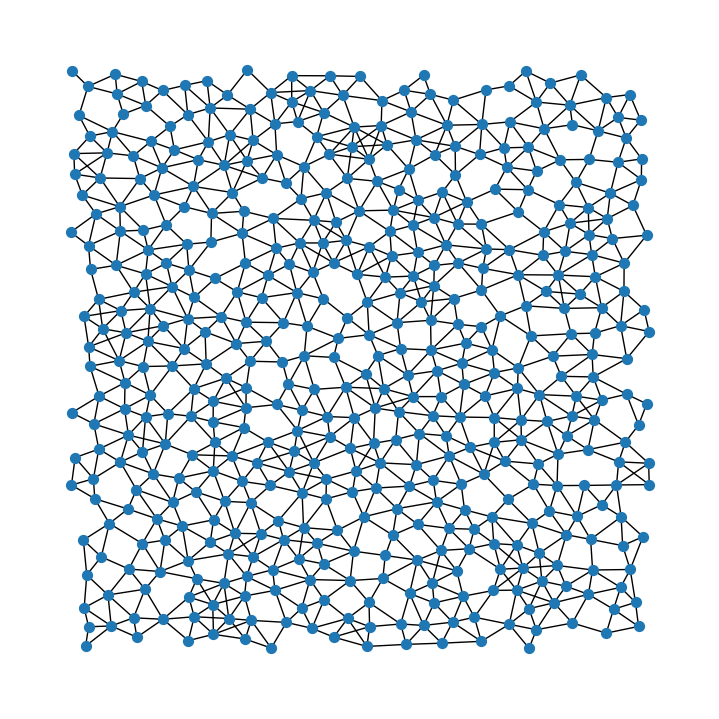

In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

dataset_sample = OneStepDataset(OUTPUT_DIR, "valid", return_pos=True)
graph, position = dataset_sample[0]

print(f"The first item in the valid set is a graph: {graph}")
print(f"This graph has {graph.num_nodes} nodes and {graph.num_edges} edges.")
print(f"Each node is a particle and each edge is the interaction between two particles.")
print(f"Each node has {graph.num_node_features} categorial feature (Data.x), which represents the type of the node.")
print(f"Each node has a {graph.pos.size(1)}-dim feature vector (Data.pos), which represents the positions and velocities of the particle (node) in several frames.")
print(f"Each edge has a {graph.num_edge_features}-dim feature vector (Data.edge_attr), which represents the relative distance and displacement between particles.")
print(f"The model is expected to predict a {graph.y.size(1)}-dim vector for each node (Data.y), which represents the acceleration of the particle.")

nx_graph = pyg.utils.to_networkx(graph).to_undirected()
nx_graph.remove_edges_from(nx.selfloop_edges(nx_graph))
plt.figure(figsize=(7, 7))
nx.draw(nx_graph, pos={i: tuple(v) for i, v in enumerate(position)}, node_size=50)
plt.show()

In [8]:
import math
import torch_scatter
import os
import glob
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch_scatter
import torch.nn as nn

class MLP(torch.nn.Module):
    def __init__(self, input_size, hidden_size, output_size, layers, layernorm=True):
        super().__init__()
        self.layers = torch.nn.ModuleList()
        for i in range(layers):
            self.layers.append(torch.nn.Linear(
                input_size if i == 0 else hidden_size,
                output_size if i == layers - 1 else hidden_size,
            ))
            if i != layers - 1:
                self.layers.append(torch.nn.ReLU())
        if layernorm:
            self.layers.append(torch.nn.LayerNorm(output_size))
        self.reset_parameters()

    def reset_parameters(self):
        for layer in self.layers:
            if isinstance(layer, torch.nn.Linear):
                layer.weight.data.normal_(0, 1 / math.sqrt(layer.in_features))
                layer.bias.data.fill_(0)

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

In [9]:
class InteractionNetwork(pyg.nn.MessagePassing):
    """Interaction Network as proposed in this paper:
    https://proceedings.neurips.cc/paper/2016/hash/3147da8ab4a0437c15ef51a5cc7f2dc4-Abstract.html"""
    def __init__(self, hidden_size, layers):
        super().__init__()
        self.lin_edge = MLP(hidden_size * 3, hidden_size, hidden_size, layers)
        self.lin_node = MLP(hidden_size * 2, hidden_size, hidden_size, layers)

    def forward(self, x, edge_index, edge_feature):
        edge_out, aggr = self.propagate(edge_index, x=(x, x), edge_feature=edge_feature)
        node_out = self.lin_node(torch.cat((x, aggr), dim=-1))
        edge_out = edge_feature + edge_out
        node_out = x + node_out
        return node_out, edge_out

    def message(self, x_i, x_j, edge_feature):
        x = torch.cat((x_i, x_j, edge_feature), dim=-1)
        x = self.lin_edge(x)
        return x

    def aggregate(self, inputs, index, dim_size=None):
        out = torch_scatter.scatter(inputs, index, dim=self.node_dim, dim_size=dim_size, reduce="sum")
        return (inputs, out)

In [10]:
class LearnedSimulator(torch.nn.Module):
    def __init__(
        self,
        hidden_size=128,
        n_mp_layers=10, # number of GNN layers
        num_particle_types=9,
        particle_type_dim=16, # embedding dimension of particle types
        dim=2, # dimension of the world, typical 2D or 3D
        window_size=5, # the model looks into W frames before the frame to be predicted
    ):
        super().__init__()
        self.window_size = window_size
        self.embed_type = torch.nn.Embedding(num_particle_types, particle_type_dim)
        self.node_in = MLP(particle_type_dim + dim * (window_size + 2), hidden_size, hidden_size, 3)
        self.edge_in = MLP(dim + 1, hidden_size, hidden_size, 3)
        self.node_out = MLP(hidden_size, hidden_size, dim, 3, layernorm=False)
        self.n_mp_layers = n_mp_layers
        self.layers = torch.nn.ModuleList([InteractionNetwork(
            hidden_size, 3
        ) for _ in range(n_mp_layers)])

        self.reset_parameters()

    def reset_parameters(self):
        torch.nn.init.xavier_uniform_(self.embed_type.weight)

    def forward(self, data):
        node_feature = torch.cat((self.embed_type(data.x), data.pos), dim=-1)
        node_feature = self.node_in(node_feature)
        edge_feature = self.edge_in(data.edge_attr)
        for i in range(self.n_mp_layers):
            node_feature, edge_feature = self.layers[i](node_feature, data.edge_index, edge_feature=edge_feature)
        out = self.node_out(node_feature)
        return out

In [11]:
data_path = OUTPUT_DIR
model_path = os.path.join("temp", "models", DATASET_NAME)
rollout_path = os.path.join("temp", "rollouts", DATASET_NAME)

!mkdir -p "$model_path"
!mkdir -p "$rollout_path"

params = {
    "epoch": 1,
    "batch_size": 4,
    "lr": 1e-4,
    "noise": 3e-4,
    "save_interval": 1000,
    "eval_interval": 1000,
    "rollout_interval": 200000,
}

In [12]:
def rollout(model, data, metadata, noise_std):
    device = next(model.parameters()).device
    model.eval()
    window_size = model.window_size + 1
    total_time = data["position"].size(0)
    traj = data["position"][:window_size]
    traj = traj.permute(1, 0, 2)
    particle_type = data["particle_type"]

    for time in range(total_time - window_size):
        with torch.no_grad():
            graph = preprocess(particle_type, traj[:, -window_size:], None, metadata, 0.0)
            graph = graph.to(device)
            acceleration = model(graph).cpu()
            acceleration = acceleration * torch.sqrt(torch.tensor(metadata["acc_std"]) ** 2 + noise_std ** 2) + torch.tensor(metadata["acc_mean"])

            recent_position = traj[:, -1]
            recent_velocity = recent_position - traj[:, -2]
            new_velocity = recent_velocity + acceleration
            new_position = recent_position + new_velocity
            traj = torch.cat((traj, new_position.unsqueeze(1)), dim=1)

    return traj


def oneStepMSE(simulator, dataloader, metadata, noise):
    total_loss = 0.0
    total_mse = 0.0
    batch_count = 0
    simulator.eval()
    with torch.no_grad():
        scale = torch.sqrt(torch.tensor(metadata["acc_std"]) ** 2 + noise ** 2).cuda()
        for data in valid_loader:
            data = data.cuda()
            pred = simulator(data)
            mse = ((pred - data.y) * scale) ** 2
            mse = mse.sum(dim=-1).mean()
            loss = ((pred - data.y) ** 2).mean()
            total_mse += mse.item()
            total_loss += loss.item()
            batch_count += 1
    return total_loss / batch_count, total_mse / batch_count


def rolloutMSE(simulator, dataset, noise):
    total_loss = 0.0
    batch_count = 0
    simulator.eval()
    with torch.no_grad():
        for rollout_data in dataset:
            rollout_out = rollout(simulator, rollout_data, dataset.metadata, noise)
            rollout_out = rollout_out.permute(1, 0, 2)
            loss = (rollout_out - rollout_data["position"]) ** 2
            loss = loss.sum(dim=-1).mean()
            total_loss += loss.item()
            batch_count += 1
    return total_loss / batch_count

In [13]:
from tqdm import tqdm

# Robust Training Function
def train(params, simulator, train_loader, valid_loader, valid_rollout_dataset):
    loss_fn = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(simulator.parameters(), lr=params["lr"])
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.1 ** (1 / 5e6))

    train_loss_list = []
    eval_loss_list = []
    onestep_mse_list = []
    rollout_mse_list = []
    total_step = 0
    start_epoch = 0

    checkpoints = glob.glob(os.path.join(model_path, "checkpoint_*.pt"))

    if checkpoints:
        latest_cp = max(checkpoints, key=lambda x: int(x.split('_')[-1].split('.')[0]))
        print(f"--> Resuming training from: {latest_cp}")

        checkpoint = torch.load(latest_cp)
        simulator.load_state_dict(checkpoint["model"])
        optimizer.load_state_dict(checkpoint["optimizer"])
        scheduler.load_state_dict(checkpoint["scheduler"])

        total_step = checkpoint.get("total_step", 0)
        train_loss_list = checkpoint.get("train_loss_list", [])
        eval_loss_list = checkpoint.get("eval_loss_list", [])
        onestep_mse_list = checkpoint.get("onestep_mse_list", [])
        rollout_mse_list = checkpoint.get("rollout_mse_list", [])

        start_epoch = total_step // len(train_loader)
    else:
        print("--> No checkpoint found. Starting from scratch.")

    # Training Loop
    try:
        for i in range(start_epoch, params["epoch"]):
            simulator.train()
            progress_bar = tqdm(train_loader, desc=f"Epoch {i}")

            total_loss = 0
            batch_count = 0

            for data in progress_bar:
                optimizer.zero_grad()
                data = data.cuda()
                pred = simulator(data)
                loss = loss_fn(pred, data.y)
                loss.backward()
                optimizer.step()
                scheduler.step()

                total_loss += loss.item()
                batch_count += 1
                total_step += 1

                progress_bar.set_postfix({
                    "loss": loss.item(),
                    "avg": total_loss / batch_count,
                    "lr": optimizer.param_groups[0]["lr"]
                })

                train_loss_list.append((total_step, loss.item()))

                if total_step % params["eval_interval"] == 0:
                    simulator.eval()
                    eval_loss, onestep_mse = oneStepMSE(simulator, valid_loader, valid_dataset.metadata, params["noise"])
                    eval_loss_list.append((total_step, eval_loss))
                    onestep_mse_list.append((total_step, onestep_mse))
                    tqdm.write(f"\nEval Step {total_step}: Loss: {eval_loss:.6f}, One Step MSE: {onestep_mse:.6f}")
                    simulator.train()

                if total_step % params["rollout_interval"] == 0:
                    simulator.eval()
                    rollout_mse = rolloutMSE(simulator, valid_rollout_dataset, params["noise"])
                    rollout_mse_list.append((total_step, rollout_mse))
                    tqdm.write(f"\nEval Step {total_step}: Rollout MSE: {rollout_mse:.6f}")
                    simulator.train()

                if total_step % params["save_interval"] == 0:
                    save_checkpoint(simulator, optimizer, scheduler, total_step,
                                    train_loss_list, eval_loss_list, onestep_mse_list, rollout_mse_list)

    except KeyboardInterrupt:
        print("\n\n!!! Training Interrupted by User !!!")
        print("Saving current state before exiting...")
        save_checkpoint(simulator, optimizer, scheduler, total_step,
                        train_loss_list, eval_loss_list, onestep_mse_list, rollout_mse_list)
        print("State saved. Returning current history for plotting.")

    return train_loss_list, eval_loss_list, onestep_mse_list, rollout_mse_list

def save_checkpoint(model, optimizer, scheduler, step, t_loss, e_loss, o_mse, r_mse):
    path = os.path.join(model_path, f"checkpoint_{step}.pt")
    torch.save({
        "model": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        "scheduler": scheduler.state_dict(),
        "total_step": step,
        "train_loss_list": t_loss,
        "eval_loss_list": e_loss,
        "onestep_mse_list": o_mse,
        "rollout_mse_list": r_mse,
    }, path)

The next block starts the training process. Given that this process is time-consuming, it is recommended to upload the last checkpoint (68000) in the repository to the temp/models/WaterDrop path to start the training process. It is also worth noting that, depending on the loss value, you can interrupt the execution of the block wherever you see fit and continue running the notebook.
The last checkpoint is the result of 8 hours of continuous execution on the T4 GPU.

In [15]:
train_dataset = OneStepDataset(data_path, "train", noise_std=params["noise"])
valid_dataset = OneStepDataset(data_path, "valid", noise_std=params["noise"])
train_loader = pyg.loader.DataLoader(train_dataset, batch_size=params["batch_size"], shuffle=True, pin_memory=True, num_workers=2)
valid_loader = pyg.loader.DataLoader(valid_dataset, batch_size=params["batch_size"], shuffle=False, pin_memory=True, num_workers=2)
valid_rollout_dataset = RolloutDataset(data_path, "valid")

simulator = LearnedSimulator()
simulator = simulator.cuda()

print("Starting training... (Press Stop/Interrupt to pause and see results)")
train_loss, eval_loss, onestep_mse, rollout_mse = train(params, simulator, train_loader, valid_loader, valid_rollout_dataset)

Starting training... (Press Stop/Interrupt to pause and see results)
--> Resuming training from: temp/models/WaterDrop/checkpoint_32000.pt


Epoch 0:   0%|          | 1000/248750 [04:49<2317:43:46, 33.68s/it, loss=0.0841, avg=0.109, lr=9.85e-5]


Eval Step 33000: Loss: 0.101919, One Step MSE: 0.000000


Epoch 0:   1%|          | 2000/248750 [09:39<2736:49:04, 39.93s/it, loss=0.123, avg=0.105, lr=9.84e-5] 


Eval Step 34000: Loss: 0.098593, One Step MSE: 0.000000


Epoch 0:   1%|          | 3000/248750 [14:26<2296:28:35, 33.64s/it, loss=0.193, avg=0.104, lr=9.84e-5]


Eval Step 35000: Loss: 0.114577, One Step MSE: 0.000000


Epoch 0:   2%|▏         | 4000/248750 [19:15<2628:30:36, 38.66s/it, loss=0.0945, avg=0.106, lr=9.84e-5]


Eval Step 36000: Loss: 0.097946, One Step MSE: 0.000000


Epoch 0:   2%|▏         | 5000/248750 [24:06<2301:56:34, 34.00s/it, loss=0.115, avg=0.105, lr=9.83e-5]


Eval Step 37000: Loss: 0.091818, One Step MSE: 0.000000


Epoch 0:   2%|▏         | 6000/248750 [28:56<2697:31:30, 40.00s/it, loss=0.059, avg=0.104, lr=9.83e-5] 


Eval Step 38000: Loss: 0.087316, One Step MSE: 0.000000


Epoch 0:   3%|▎         | 7000/248750 [33:47<2074:15:34, 30.89s/it, loss=0.0886, avg=0.103, lr=9.82e-5]


Eval Step 39000: Loss: 0.086821, One Step MSE: 0.000000


Epoch 0:   3%|▎         | 8000/248750 [38:40<2696:16:11, 40.32s/it, loss=0.0815, avg=0.102, lr=9.82e-5]


Eval Step 40000: Loss: 0.092682, One Step MSE: 0.000000


Epoch 0:   4%|▎         | 9000/248750 [43:29<2257:04:56, 33.89s/it, loss=0.0988, avg=0.101, lr=9.81e-5]


Eval Step 41000: Loss: 0.091567, One Step MSE: 0.000000


Epoch 0:   4%|▍         | 10000/248750 [48:20<2648:26:42, 39.93s/it, loss=0.107, avg=0.102, lr=9.81e-5]


Eval Step 42000: Loss: 0.106352, One Step MSE: 0.000000


Epoch 0:   4%|▍         | 11000/248750 [53:08<2216:36:55, 33.56s/it, loss=0.113, avg=0.101, lr=9.8e-5]


Eval Step 43000: Loss: 0.088081, One Step MSE: 0.000000


Epoch 0:   5%|▍         | 12000/248750 [58:00<2124:19:58, 32.30s/it, loss=0.127, avg=0.101, lr=9.8e-5] 


Eval Step 44000: Loss: 0.089410, One Step MSE: 0.000000


Epoch 0:   5%|▌         | 13000/248750 [1:02:51<2229:11:31, 34.04s/it, loss=0.0702, avg=0.101, lr=9.79e-5]


Eval Step 45000: Loss: 0.086063, One Step MSE: 0.000000


Epoch 0:   6%|▌         | 13999/248750 [1:07:44<4:08:24, 15.75it/s, loss=0.0886, avg=0.101, lr=9.79e-5]


Eval Step 46000: Loss: 0.108568, One Step MSE: 0.000000


Epoch 0:   6%|▌         | 15000/248750 [1:12:39<2562:42:19, 39.47s/it, loss=0.175, avg=0.101, lr=9.79e-5] 


Eval Step 47000: Loss: 0.084700, One Step MSE: 0.000000


Epoch 0:   6%|▋         | 16000/248750 [1:17:30<2209:11:21, 34.17s/it, loss=0.0693, avg=0.0999, lr=9.78e-5]


Eval Step 48000: Loss: 0.082418, One Step MSE: 0.000000


Epoch 0:   7%|▋         | 17000/248750 [1:22:24<2213:12:07, 34.38s/it, loss=0.152, avg=0.0994, lr=9.78e-5]


Eval Step 49000: Loss: 0.113915, One Step MSE: 0.000000


Epoch 0:   7%|▋         | 18000/248750 [1:27:17<2201:48:03, 34.35s/it, loss=0.103, avg=0.0987, lr=9.77e-5] 


Eval Step 50000: Loss: 0.085162, One Step MSE: 0.000000


Epoch 0:   8%|▊         | 18998/248750 [1:32:18<4:51:48, 13.12it/s, loss=0.136, avg=0.0981, lr=9.77e-5]


Eval Step 51000: Loss: 0.096723, One Step MSE: 0.000000


Epoch 0:   8%|▊         | 20000/248750 [1:37:18<2233:04:39, 35.14s/it, loss=0.0551, avg=0.098, lr=9.76e-5]


Eval Step 52000: Loss: 0.081071, One Step MSE: 0.000000


Epoch 0:   8%|▊         | 20998/248750 [1:42:08<3:51:40, 16.38it/s, loss=0.0672, avg=0.0976, lr=9.76e-5]


Eval Step 53000: Loss: 0.128722, One Step MSE: 0.000000


Epoch 0:   9%|▉         | 22000/248750 [1:47:02<2542:55:52, 40.37s/it, loss=0.0823, avg=0.0974, lr=9.75e-5]


Eval Step 54000: Loss: 0.084801, One Step MSE: 0.000000


Epoch 0:   9%|▉         | 23000/248750 [1:51:53<2501:59:26, 39.90s/it, loss=0.142, avg=0.0969, lr=9.75e-5]


Eval Step 55000: Loss: 0.076420, One Step MSE: 0.000000


Epoch 0:  10%|▉         | 24000/248750 [1:56:44<2129:20:36, 34.11s/it, loss=0.075, avg=0.0965, lr=9.75e-5] 


Eval Step 56000: Loss: 0.078535, One Step MSE: 0.000000


Epoch 0:  10%|█         | 25000/248750 [2:01:33<2103:49:25, 33.85s/it, loss=0.0675, avg=0.096, lr=9.74e-5]


Eval Step 57000: Loss: 0.080219, One Step MSE: 0.000000


Epoch 0:  10%|█         | 26000/248750 [2:06:22<2090:13:58, 33.78s/it, loss=0.0594, avg=0.0957, lr=9.74e-5]


Eval Step 58000: Loss: 0.078575, One Step MSE: 0.000000


Epoch 0:  11%|█         | 27000/248750 [2:11:12<2099:42:57, 34.09s/it, loss=0.101, avg=0.0954, lr=9.73e-5]


Eval Step 59000: Loss: 0.077567, One Step MSE: 0.000000


Epoch 0:  11%|█▏        | 28000/248750 [2:16:03<2455:31:53, 40.04s/it, loss=0.0763, avg=0.0949, lr=9.73e-5]


Eval Step 60000: Loss: 0.072323, One Step MSE: 0.000000


Epoch 0:  12%|█▏        | 28998/248750 [2:20:53<3:40:00, 16.65it/s, loss=0.0747, avg=0.0946, lr=9.72e-5]


Eval Step 61000: Loss: 0.083409, One Step MSE: 0.000000


Epoch 0:  12%|█▏        | 29999/248750 [2:25:51<3:23:22, 17.93it/s, loss=0.0689, avg=0.0941, lr=9.72e-5]


Eval Step 62000: Loss: 0.079861, One Step MSE: 0.000000


Epoch 0:  12%|█▏        | 30998/248750 [2:30:51<4:06:57, 14.70it/s, loss=0.0651, avg=0.0938, lr=9.71e-5]


Eval Step 63000: Loss: 0.072853, One Step MSE: 0.000000


Epoch 0:  13%|█▎        | 32000/248750 [2:35:59<2189:43:27, 36.37s/it, loss=0.0553, avg=0.0934, lr=9.71e-5]


Eval Step 64000: Loss: 0.080653, One Step MSE: 0.000000


Epoch 0:  13%|█▎        | 33000/248750 [2:41:07<2176:06:04, 36.31s/it, loss=0.568, avg=0.0929, lr=9.71e-5] 


Eval Step 65000: Loss: 0.075980, One Step MSE: 0.000000


Epoch 0:  14%|█▎        | 34000/248750 [2:46:18<2185:44:10, 36.64s/it, loss=0.0615, avg=0.0927, lr=9.7e-5]


Eval Step 66000: Loss: 0.075188, One Step MSE: 0.000000


Epoch 0:  14%|█▍        | 35000/248750 [2:51:27<2542:38:40, 42.82s/it, loss=0.0855, avg=0.0923, lr=9.7e-5]


Eval Step 67000: Loss: 0.071234, One Step MSE: 0.000000


Epoch 0:  14%|█▍        | 35998/248750 [2:56:37<3:54:34, 15.12it/s, loss=0.145, avg=0.0918, lr=9.69e-5]


Eval Step 68000: Loss: 0.067359, One Step MSE: 0.000000


Epoch 0:  15%|█▍        | 36223/248750 [2:56:53<17:17:50,  3.41it/s, loss=0.0358, avg=0.0917, lr=9.69e-5]



!!! Training Interrupted by User !!!
Saving current state before exiting...
State saved. Returning current history for plotting.


Below you can see the latest model results.


Plotting results...


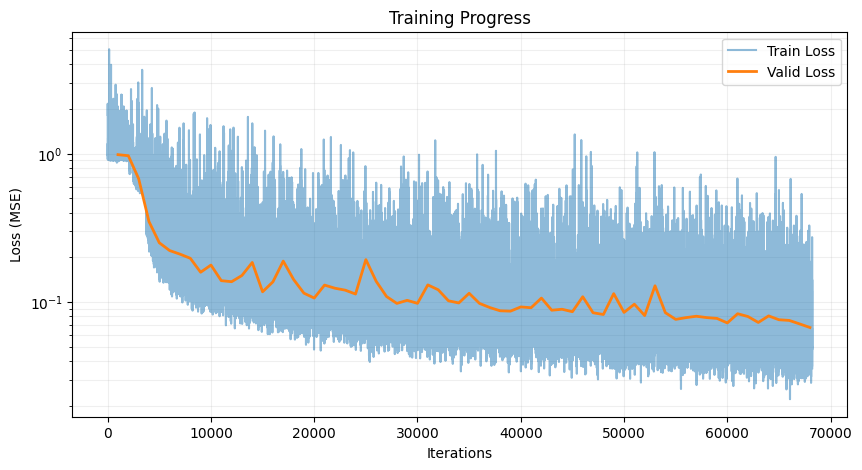

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt

print("\nPlotting results...")
plt.figure(figsize=(10, 5))
if train_loss:
    plt.plot(*zip(*train_loss), label="Train Loss", alpha=0.5)
if eval_loss:
    plt.plot(*zip(*eval_loss), label="Valid Loss", linewidth=2)
plt.xlabel('Iterations')
plt.ylabel('Loss (MSE)')
plt.title('Training Progress')
plt.legend()
plt.yscale('log')
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.show()

In [22]:
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display
import numpy as np
import torch
import numpy as np

TYPE_TO_COLOR = {
    3: "black",
    0: "green",
    7: "magenta",
    6: "gold",
    5: "blue",
}

def visualize_prepare(ax, particle_type, position, metadata):
    bounds = metadata["bounds"]
    ax.set_xlim(bounds[0][0], bounds[0][1])
    ax.set_ylim(bounds[1][0], bounds[1][1])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect(1.0)
    points = {type_: ax.plot([], [], "o", ms=2, color=color)[0] for type_, color in TYPE_TO_COLOR.items()}
    return ax, position, points

def visualize_pair(particle_type, position_pred, position_gt, metadata):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    plot_info = [
        visualize_prepare(axes[0], particle_type, position_gt, metadata),
        visualize_prepare(axes[1], particle_type, position_pred, metadata),
    ]
    axes[0].set_title("Ground truth")
    axes[1].set_title("Prediction")

    plt.close()

    def update(step_i):
        outputs = []
        for _, position, points in plot_info:
            for type_, line in points.items():
                mask = particle_type == type_
                x_data = position[step_i, mask, 0]
                y_data = position[step_i, mask, 1]
                if isinstance(x_data, torch.Tensor):
                    x_data = x_data.cpu()
                    y_data = y_data.cpu()
                line.set_data(x_data, y_data)
            outputs.append(line)
        return outputs

    return animation.FuncAnimation(fig, update, frames=np.arange(0, position_gt.size(0)), interval=10, blit=True)

# Execution

simulator.eval()

num_rollouts = 3
print(f"Starting generation for the first {num_rollouts} rollouts...\n")

for i in range(num_rollouts):
    print(f"[{i+1}/{num_rollouts}] Processing rollout index {i}...")

    rollout_data = rollout_dataset[i + 5]

    print(f"    > Running simulation ({rollout_data['position'].size(0)} steps)...")
    rollout_out = rollout(simulator, rollout_data, rollout_dataset.metadata, params["noise"])
    rollout_out = rollout_out.permute(1, 0, 2)

    print("    > Rendering video...")
    anim = visualize_pair(
        rollout_data["particle_type"],
        rollout_out,
        rollout_data["position"],
        rollout_dataset.metadata
    )

    display(HTML(anim.to_html5_video()))

    plt.close('all')
    print("    > Done.\n")

print("All rollouts completed.")

Starting generation for the first 3 rollouts...

[1/3] Processing rollout index 0...
    > Running simulation (1001 steps)...
    > Rendering video...


    > Done.

[2/3] Processing rollout index 1...
    > Running simulation (1001 steps)...
    > Rendering video...


    > Done.

[3/3] Processing rollout index 2...
    > Running simulation (1001 steps)...
    > Rendering video...


    > Done.

All rollouts completed.
